Name- Aryan Saini

B.Tech CSE 3rd year

section- C

cu24250069

computer vision labsheet 8



In [1]:
from google.colab import files

uploaded = files.upload()

Saving Video Project 2.mp4 to Video Project 2.mp4


In [5]:
import cv2

video_path = "/content/Video Project 2.mp4"

cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("❌ Could not open video.")
else:
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    duration = frame_count / fps if fps > 0 else 0

    print("✅ Video opened successfully!")
    print("Resolution:", width, "x", height)
    print("FPS:", fps)
    print("Total Frames:", frame_count)
    print("Duration:", round(duration, 2), "seconds")

cap.release()

✅ Video opened successfully!
Resolution: 1280 x 720
FPS: 30.0
Total Frames: 59
Duration: 1.97 seconds


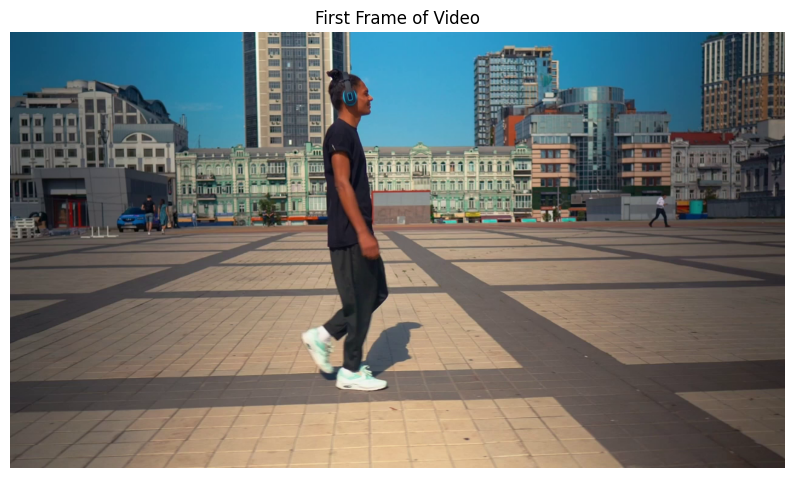

In [6]:
import cv2
import matplotlib.pyplot as plt

cap = cv2.VideoCapture("/content/Video Project 2.mp4")

ret, frame = cap.read()
cap.release()

if ret:
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 6))
    plt.imshow(frame_rgb)
    plt.title("First Frame of Video")
    plt.axis("off")
    plt.show()
else:
    print("❌ Could not read the video frame.")

**Shi-Tomasi Corner Detection**

In [8]:
cap = cv2.VideoCapture(video_path)

ret, old_frame = cap.read()
cap.release()

if not ret:
    print("❌ Could not read video.")
else:
    old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)

    feature_params = dict(
        maxCorners=100,
        qualityLevel=0.3,
        minDistance=7,
        blockSize=7
    )

    p0 = cv2.goodFeaturesToTrack(
        old_gray,
        mask=None,
        **feature_params
    )

    print("Number of feature points detected:", len(p0))

Number of feature points detected: 100


**Display Shi-Tomasi points**

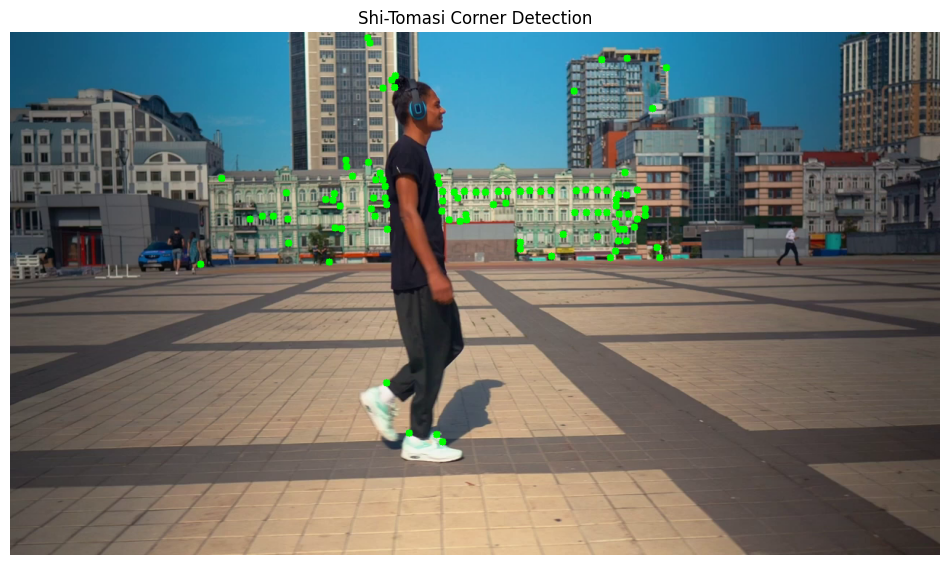

In [9]:
display_frame = old_frame.copy()

for point in p0:
    x, y = point.ravel()

    cv2.circle(
        display_frame,
        (int(x), int(y)),
        5,
        (0, 255, 0),
        -1
    )

display_rgb = cv2.cvtColor(
    display_frame,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(12, 7))
plt.imshow(display_rgb)
plt.title("Shi-Tomasi Corner Detection")
plt.axis("off")
plt.show()

**Lucas–Kanade Optical Flow**

In [10]:
lk_params = dict(
    winSize=(15, 15),
    maxLevel=2,
    criteria=(
        cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT,
        10,
        0.03
    )
)

print("Lucas-Kanade parameters configured.")

Lucas-Kanade parameters configured.


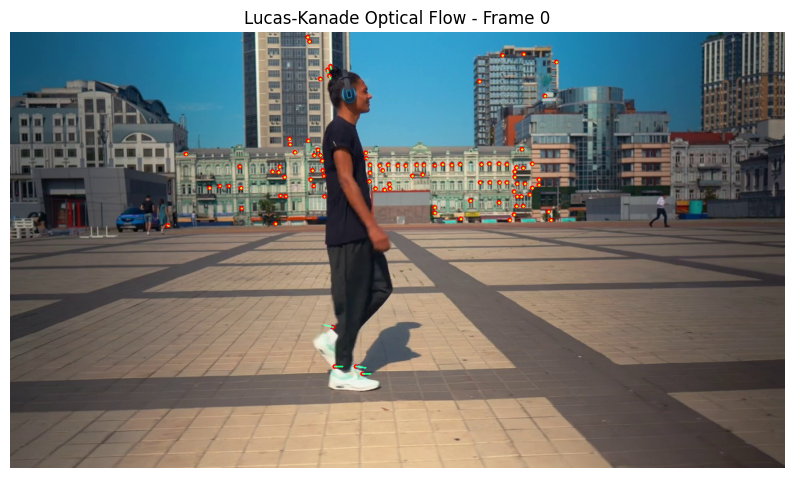

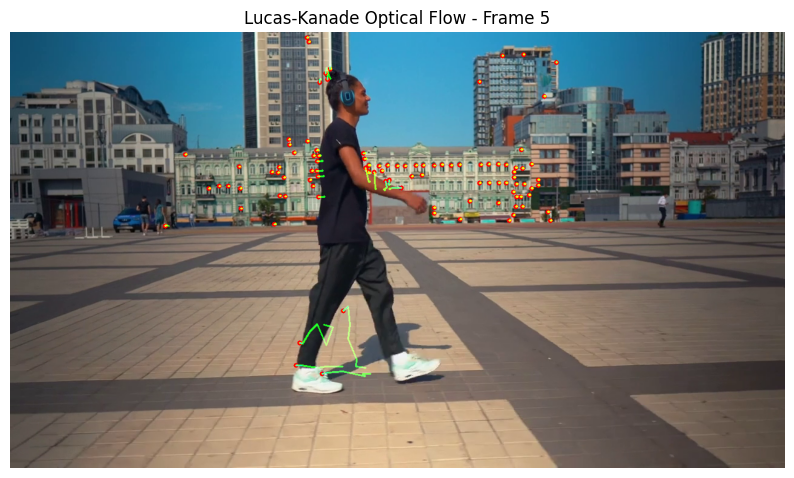

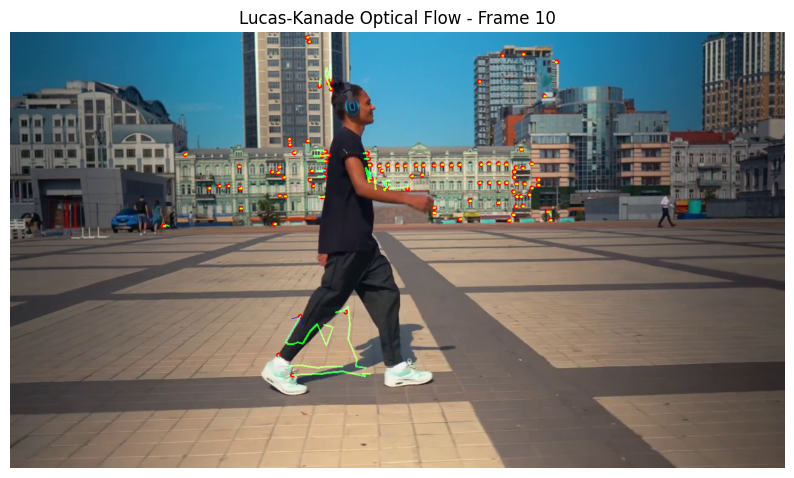

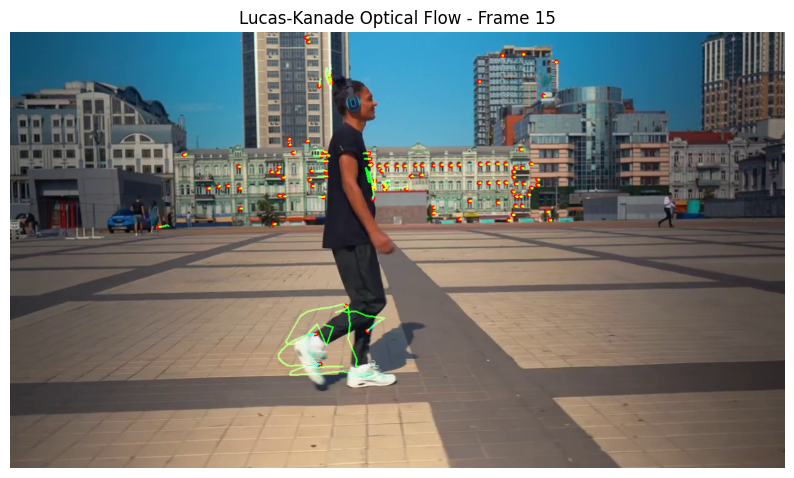

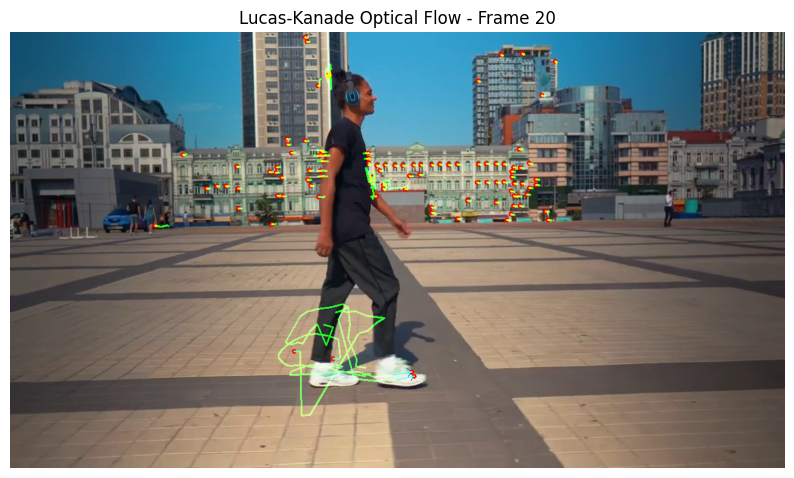

...

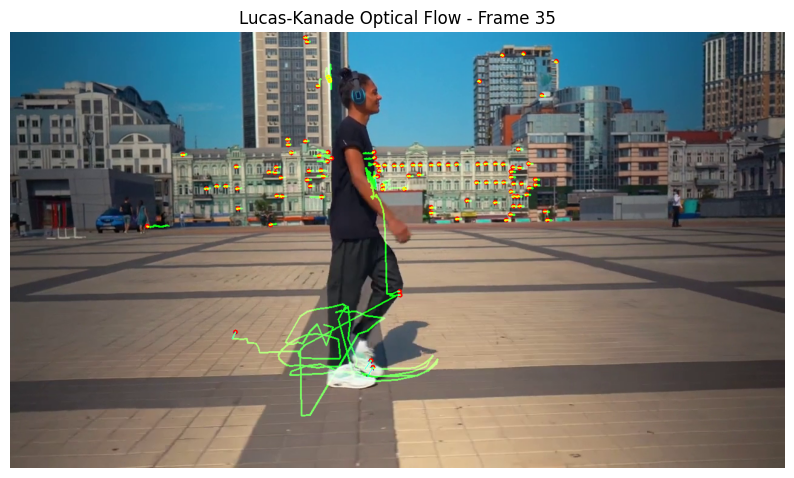

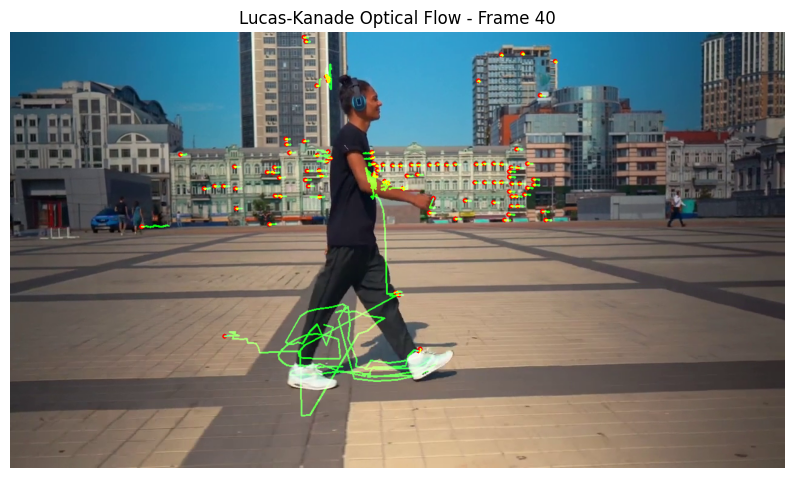

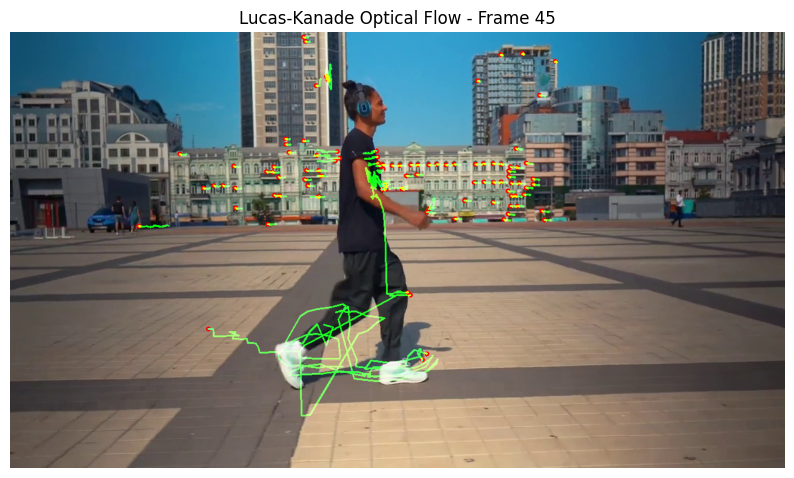

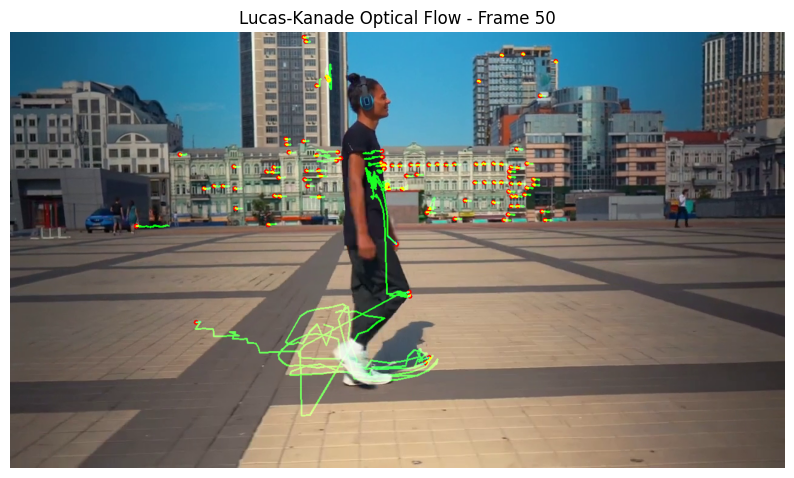

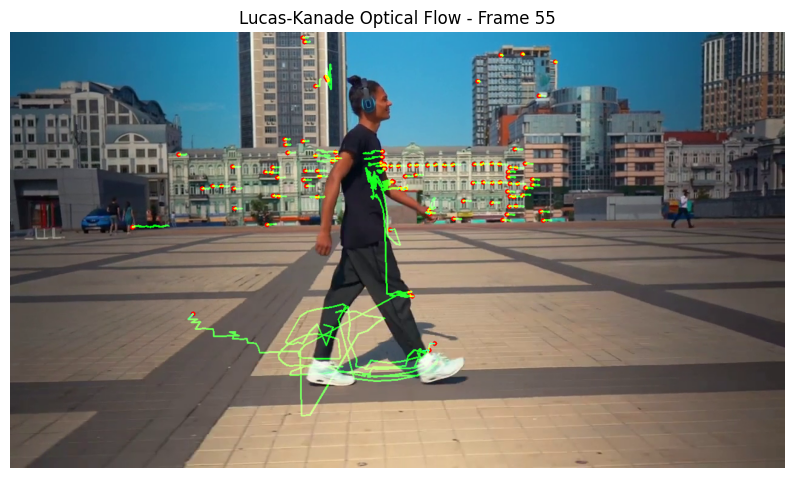

✅ Lucas-Kanade tracking completed.


In [11]:
cap = cv2.VideoCapture(video_path)

ret, old_frame = cap.read()

if not ret:
    print("❌ Could not read video.")
else:

    old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)

    # Detect Shi-Tomasi points
    p0 = cv2.goodFeaturesToTrack(
        old_gray,
        mask=None,
        **feature_params
    )

    # Mask for drawing trajectories
    mask = np.zeros_like(old_frame)

    frame_number = 0

    # Store motion data
    motion_magnitudes = []
    motion_directions = []

    while True:

        ret, frame = cap.read()

        if not ret:
            break

        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Lucas-Kanade Optical Flow
        p1, st, err = cv2.calcOpticalFlowPyrLK(
            old_gray,
            frame_gray,
            p0,
            None,
            **lk_params
        )

        if p1 is None:
            break

        # Select successfully tracked points
        good_new = p1[st == 1]
        good_old = p0[st == 1]

        frame_magnitudes = []
        frame_directions = []

        for new, old in zip(good_new, good_old):

            x_new, y_new = new.ravel()
            x_old, y_old = old.ravel()

            dx = x_new - x_old
            dy = y_new - y_old

            magnitude = np.sqrt(dx**2 + dy**2)

            # Direction in degrees
            angle = np.degrees(np.arctan2(dy, dx))

            frame_magnitudes.append(magnitude)
            frame_directions.append(angle)

            # Draw trajectory
            mask = cv2.line(
                mask,
                (int(x_new), int(y_new)),
                (int(x_old), int(y_old)),
                (0, 255, 0),
                2
            )

            # Draw current point
            frame = cv2.circle(
                frame,
                (int(x_new), int(y_new)),
                4,
                (0, 0, 255),
                -1
            )

            # Draw displacement vector
            cv2.arrowedLine(
                frame,
                (int(x_old), int(y_old)),
                (int(x_new), int(y_new)),
                (255, 0, 0),
                1,
                tipLength=0.3
            )

        # Store average motion
        if frame_magnitudes:
            motion_magnitudes.append(
                np.mean(frame_magnitudes)
            )

            motion_directions.append(
                np.mean(frame_directions)
            )

        # Combine trajectory mask with frame
        output = cv2.add(frame, mask)

        # Display every 5th frame
        if frame_number % 5 == 0:

            output_rgb = cv2.cvtColor(
                output,
                cv2.COLOR_BGR2RGB
            )

            plt.figure(figsize=(10, 6))
            plt.imshow(output_rgb)
            plt.title(
                f"Lucas-Kanade Optical Flow - Frame {frame_number}"
            )
            plt.axis("off")
            plt.show()

        # Update previous frame and points
        old_gray = frame_gray.copy()

        p0 = good_new.reshape(-1, 1, 2)

        frame_number += 1

    cap.release()

print("✅ Lucas-Kanade tracking completed.")

**Calculate average displacement and direction**

In [13]:
if motion_magnitudes:

    average_magnitude = np.mean(motion_magnitudes)
    maximum_magnitude = np.max(motion_magnitudes)

    average_direction = np.mean(motion_directions)

    print("Motion Analysis")
    print("----------------------------")
    print(
        "Average displacement:",
        round(average_magnitude, 3),
        "pixels/frame"
    )

    print(
        "Maximum displacement:",
        round(maximum_magnitude, 3),
        "pixels/frame"
    )

    print(
        "Average direction:",
        round(average_direction, 2),
        "degrees"
    )

else:
    print("No motion data available.")

Motion Analysis
----------------------------
Average displacement: 1.195 pixels/frame
Maximum displacement: 3.627 pixels/frame
Average direction: 7.82 degrees


**Plot motion magnitude**

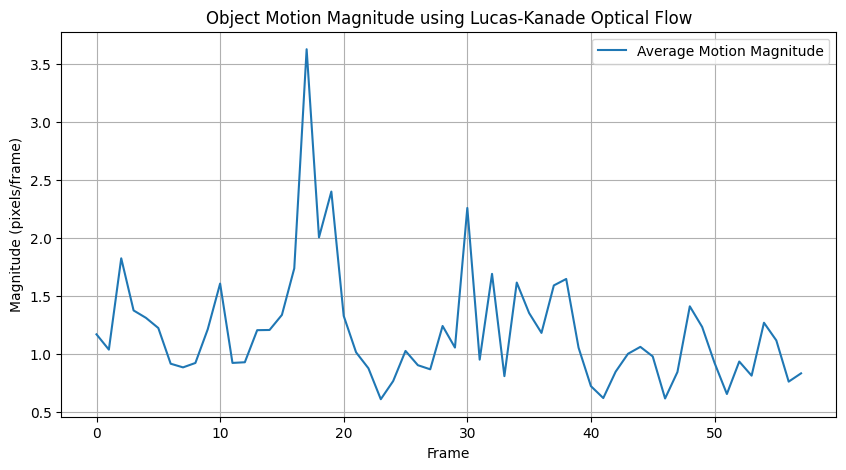

In [14]:
plt.figure(figsize=(10, 5))

plt.plot(
    motion_magnitudes,
    label="Average Motion Magnitude"
)

plt.xlabel("Frame")
plt.ylabel("Magnitude (pixels/frame)")
plt.title("Object Motion Magnitude using Lucas-Kanade Optical Flow")
plt.legend()
plt.grid(True)

plt.show()

**Farneback Optical Flow**

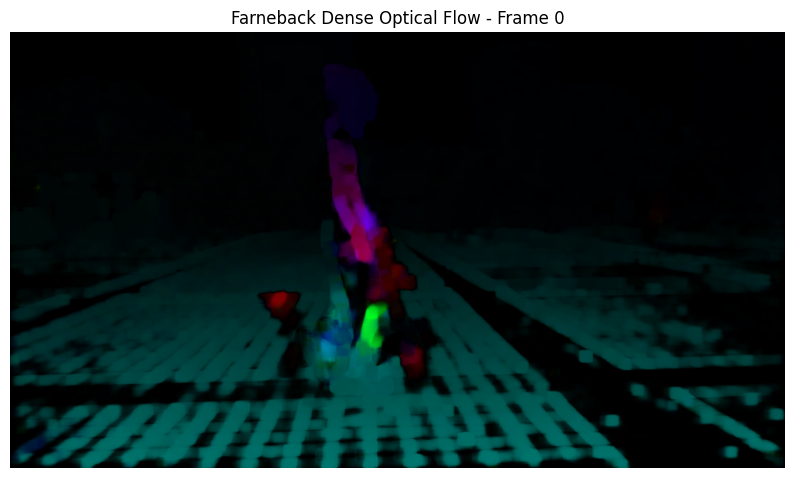

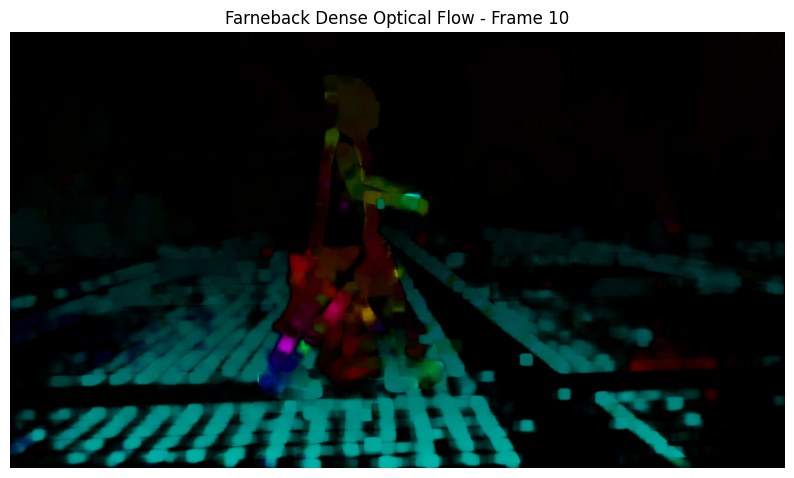

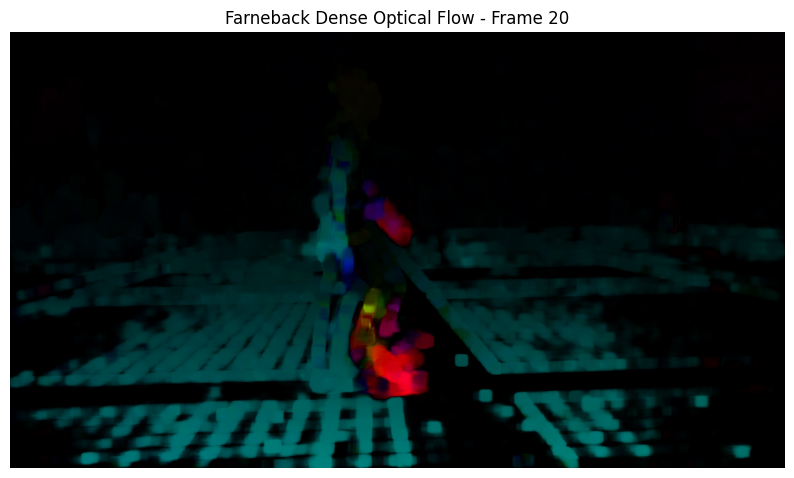

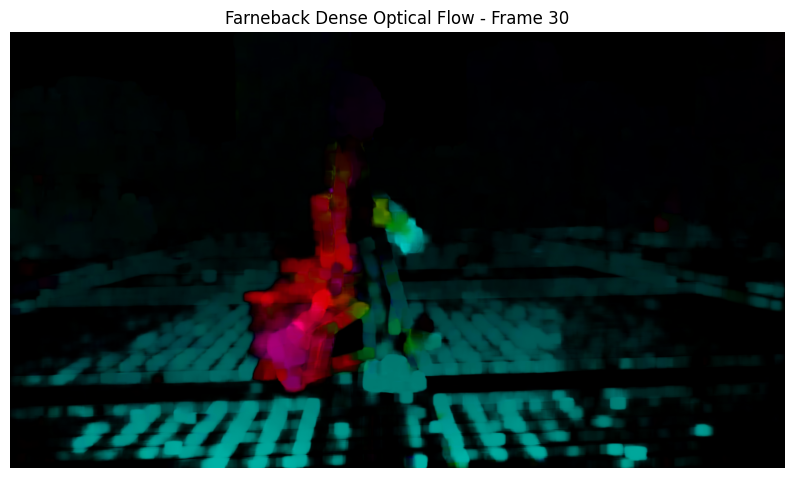

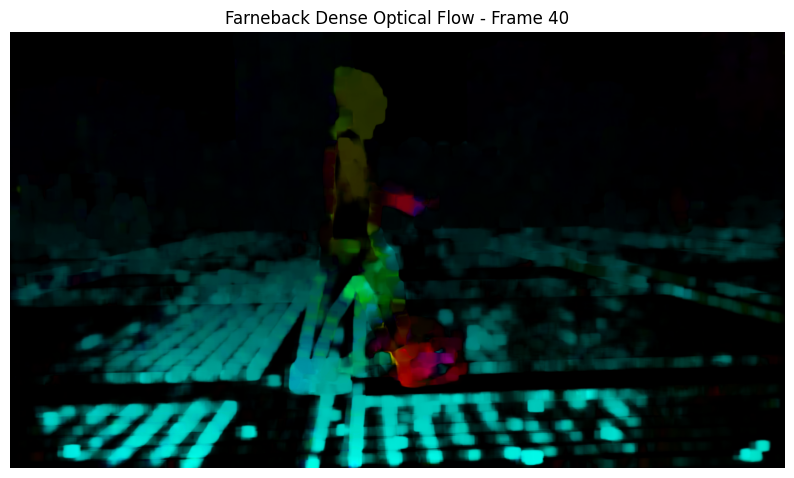

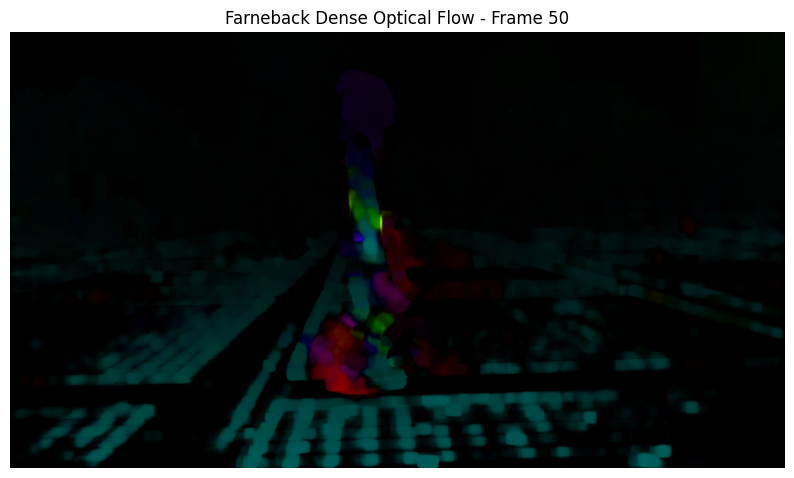

✅ Farneback Optical Flow completed.


In [15]:
cap = cv2.VideoCapture(video_path)

ret, first_frame = cap.read()

if not ret:
    print("❌ Could not read video.")
else:

    prev_gray = cv2.cvtColor(
        first_frame,
        cv2.COLOR_BGR2GRAY
    )

    farneback_magnitudes = []
    frame_number = 0

    while True:

        ret, frame = cap.read()

        if not ret:
            break

        gray = cv2.cvtColor(
            frame,
            cv2.COLOR_BGR2GRAY
        )

        # Farneback Dense Optical Flow
        flow = cv2.calcOpticalFlowFarneback(
            prev_gray,
            gray,
            None,
            0.5,
            3,
            15,
            3,
            5,
            1.2,
            0
        )

        # Convert flow to magnitude and angle
        magnitude, angle = cv2.cartToPolar(
            flow[..., 0],
            flow[..., 1]
        )

        average_magnitude = np.mean(magnitude)

        farneback_magnitudes.append(
            average_magnitude
        )

        # HSV visualization
        hsv = np.zeros_like(frame)

        hsv[..., 1] = 255

        hsv[..., 0] = angle * 180 / np.pi / 2

        hsv[..., 2] = cv2.normalize(
            magnitude,
            None,
            0,
            255,
            cv2.NORM_MINMAX
        )

        flow_rgb = cv2.cvtColor(
            hsv,
            cv2.COLOR_HSV2RGB
        )

        # Display every 10th frame
        if frame_number % 10 == 0:

            plt.figure(figsize=(10, 6))
            plt.imshow(flow_rgb)
            plt.title(
                f"Farneback Dense Optical Flow - Frame {frame_number}"
            )
            plt.axis("off")
            plt.show()

        prev_gray = gray
        frame_number += 1

    cap.release()

print("✅ Farneback Optical Flow completed.")

**Comparison graph**

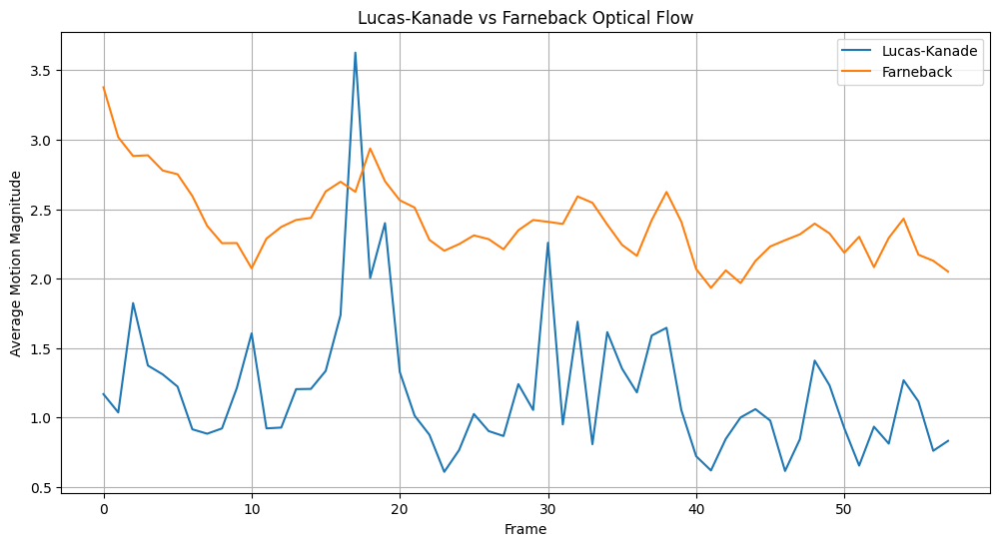

In [16]:
plt.figure(figsize=(12, 6))

plt.plot(
    motion_magnitudes,
    label="Lucas-Kanade"
)

plt.plot(
    farneback_magnitudes,
    label="Farneback"
)

plt.xlabel("Frame")
plt.ylabel("Average Motion Magnitude")
plt.title("Lucas-Kanade vs Farneback Optical Flow")
plt.legend()
plt.grid(True)

plt.show()

**Numerical comparison**

In [17]:
lk_average = np.mean(motion_magnitudes)
fb_average = np.mean(farneback_magnitudes)

print("Optical Flow Comparison")
print("==============================")

print(
    "Lucas-Kanade Average Motion:",
    round(lk_average, 4)
)

print(
    "Farneback Average Motion:",
    round(fb_average, 4)
)

print("\nLucas-Kanade:")
print("- Tracks selected feature points.")
print("- Sparse optical flow.")
print("- Computationally efficient.")

print("\nFarneback:")
print("- Estimates motion for dense regions.")
print("- Dense optical flow.")
print("- Provides motion information across the image.")

Optical Flow Comparison
Lucas-Kanade Average Motion: 1.1946
Farneback Average Motion: 2.4013

Lucas-Kanade:
- Tracks selected feature points.
- Sparse optical flow.
- Computationally efficient.

Farneback:
- Estimates motion for dense regions.
- Dense optical flow.
- Provides motion information across the image.


**Speed Analysis**

* Estimate average speed


In [18]:
if fps > 0:

    average_speed_pixels_per_second = (
        average_magnitude * fps
    )

    print(
        "Estimated Average Speed:",
        round(average_speed_pixels_per_second, 2),
        "pixels/second"
    )

else:

    print("FPS information unavailable.")

Estimated Average Speed: 61.52 pixels/second


**Final Visualization**

* Motion trajectory summary

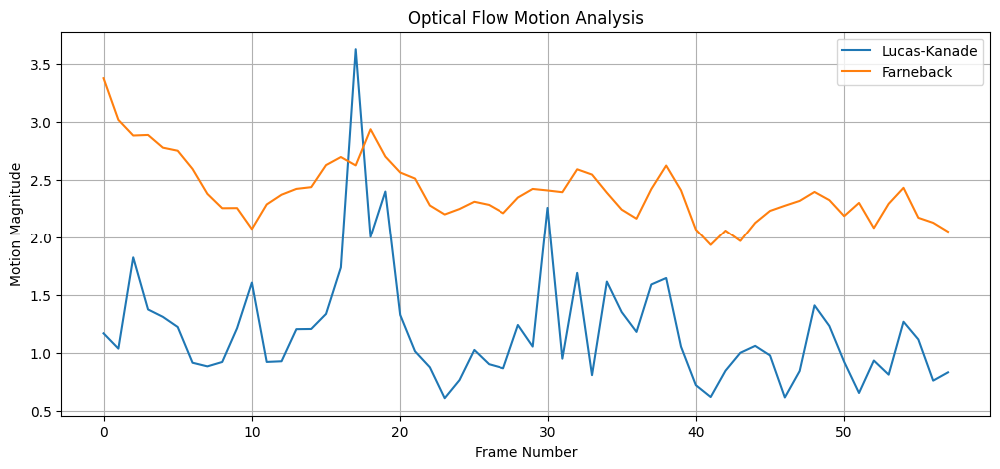

In [19]:
plt.figure(figsize=(12, 5))

plt.plot(
    motion_magnitudes,
    label="Lucas-Kanade"
)

plt.plot(
    farneback_magnitudes,
    label="Farneback"
)

plt.title("Optical Flow Motion Analysis")
plt.xlabel("Frame Number")
plt.ylabel("Motion Magnitude")
plt.legend()
plt.grid(True)

plt.show()

**Observation:**

Shi-Tomasi corner detection was used to identify suitable feature points in the video. Lucas-Kanade Optical Flow successfully tracked these feature points across consecutive frames and provided their displacement and motion direction. Farneback Dense Optical Flow was then applied to estimate motion over a larger number of pixels in the image. The motion magnitude varied according to the movement of objects in the video. Optical Flow performance can be affected by object speed, illumination changes, occlusion, and camera movement.



**Q & A**

1. How does object tracking differ from object detection?

Answer:
Object detection identifies the location and class of objects in individual frames, usually by drawing bounding boxes around them. Object tracking follows an already identified object across consecutive video frames and maintains its position and movement over time. Detection answers "What and where is the object?", while tracking answers "Where did the object move?"

2. Explain how Optical Flow can be used for real-time object tracking.

Answer:
Optical Flow estimates the apparent motion of pixels or feature points between consecutive video frames. By calculating the displacement of selected points, the movement of an object can be tracked continuously. The resulting motion vectors can provide information about the object's trajectory, direction, and movement magnitude.

3. What is the role of Shi-Tomasi Corner Detection in the Lucas-Kanade Optical Flow algorithm?

Answer:
Shi-Tomasi Corner Detection identifies strong and distinctive feature points in an image. These points are suitable for tracking because their locations can be reliably determined in consecutive frames. Lucas-Kanade then calculates the movement of these selected feature points between frames.

4. Why is Optical Flow suitable for motion analysis in videos?

Answer:
Optical Flow provides information about the apparent movement of pixels between consecutive frames. It can therefore be used to determine motion direction, displacement, trajectories, and movement patterns. This makes it useful for applications such as object tracking, traffic monitoring, surveillance, and activity analysis.

5. What challenges arise while tracking fast-moving or partially occluded objects?

Answer:
Fast-moving objects can move significantly between consecutive frames, making feature matching difficult. Partial occlusion can hide important feature points, causing the tracker to lose the object. Changes in illumination, motion blur, similar-looking objects, and camera movement can also reduce tracking accuracy.

6. Compare Optical Flow-based tracking with deep learning-based object tracking methods.

| Optical Flow                             | Deep Learning Tracking                                  |
| ---------------------------------------- | ------------------------------------------------------- |
| Estimates pixel/feature motion           | Uses trained neural networks                            |
| Can work without extensive training data | Usually requires training data                          |
| Generally computationally lighter        | Usually more computationally demanding                  |
| Sensitive to illumination and occlusion  | Can learn more complex visual features                  |
| Useful for motion estimation             | Can provide stronger object identification and tracking |


7. How can Optical Flow be used in traffic monitoring and autonomous driving systems?

Answer:
Optical Flow can estimate the movement of vehicles, pedestrians, and other objects from video. In traffic monitoring, it can help analyze vehicle movement and traffic patterns. In autonomous driving, motion information can contribute to estimating the movement of surrounding objects and understanding changes in the vehicle's visual environment.


8. Explain the effect of camera motion on Optical Flow estimation.

Answer:
Optical Flow measures apparent motion in the image. Therefore, when the camera itself moves, many or all image regions may show motion even if the objects themselves are stationary. This can make it difficult to distinguish camera-induced motion from actual object motion. Camera-motion compensation or additional techniques may therefore be required.

9. Mention five real-world applications where motion analysis using Optical Flow is commonly employed.

Answer:

* Traffic monitoring
* Human activity recognition
* Autonomous navigation
* Video surveillance
* Sports analytics

10. How can Optical Flow improve the performance of surveillance, robotics, and human activity recognition systems?

Answer:
Optical Flow provides information about how objects and regions move over time. In surveillance, it can help identify unusual movement and track objects. In robotics, it can provide information about environmental motion and navigation. In human activity recognition, motion patterns can help distinguish activities such as walking, running, or other movements.

